In [1]:
#import a lot of stuff
from time import time
import logging
import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.decomposition import PCA
from sklearn.svm import SVR

import numpy as np
import pandas as pd
import os

#define which scan you will be working with
file_name = 'line 1 fast scan'

#go to the correct working directory. Useful for saving files later
os.chdir('C:\\Users\\evanm\\Documents\\School\\Graduate\\Data\\Hitachi 4300\\191002\\EBSD Scans')
os.getcwd()

#open up the original dataframe made earlier with the same name. We are going to make it bigger
data = pd.read_hdf(file_name + ' compdataframe.h5')
data.head(1)

,File Path,X,Y,Y Real,Image,Mean,Median,Std. Dev.,IQ,CI,Fit,Phi,Phi1,Phi2
0,C:\Users\evanm\Documents\School\Graduate\Data\...,0,0,0.0,"[[2451, 2436, 2448, 2442, 2469, 2478, 2448, 24...",2509.133438,2499.0,92.303863,8047.978027,0.0,2.03,1.08671,5.14619,4.64023


In [2]:
#defining several variables for later use in the different machine learing models
n_samples = data['Image'].shape[0]
h, w = data['Image'][0].shape

n_features = h*w

#X will remain the main data variable for the different models
#if it is modified the previous version is usual saved to some other variable
X_raw = data['Image'].values

all_names = []

iq_min = np.min(data['IQ'])
iq_max = np.max(data['IQ'])
iq_25 = 0.25*(iq_max-iq_min)+iq_min
    
for i in range(data['IQ'].shape[0]):
    if data['IQ'][i]>iq_25:
        all_names.append('crystal')
    else:
        all_names.append('not crystal')

all_names = np.asarray(all_names)
target_names = set(all_names)       
        
n_classes = len(target_names)

Y_iq = data['IQ'].values
Y_ci = data['CI'].values
Y_phi = data['Phi'].values
Y_phi1 = data['Phi1'].values
Y_phi2 = data['Phi2'].values

print("Total dataset size:")
print("n_samples: %d" % n_samples)
print("n_features: %d" % n_features)
print("n_classes: %d" % n_classes)

Total dataset size:
n_samples: 5955
n_features: 57600
n_classes: 2


C:\Users\evanm\Anaconda3\lib\site-packages\ipykernel_launcher.py:18: RuntimeWarning: invalid value encountered in greater


In [3]:
#Loads the Radon transform and saves to a variable. 4GB file (can take some time)
data_radon = pd.read_hdf(file_name + ' radon.h5', key = 'file_name')
x_rad = data_radon['Radon']
data_radon.head(3)

,Radon
0,"[-84.49294258355926, -47.159759560515404, -44...."
1,"[-165.27185901692505, -104.28101342267601, -94..."
2,"[-172.18294194466927, -106.42622868879312, -94..."


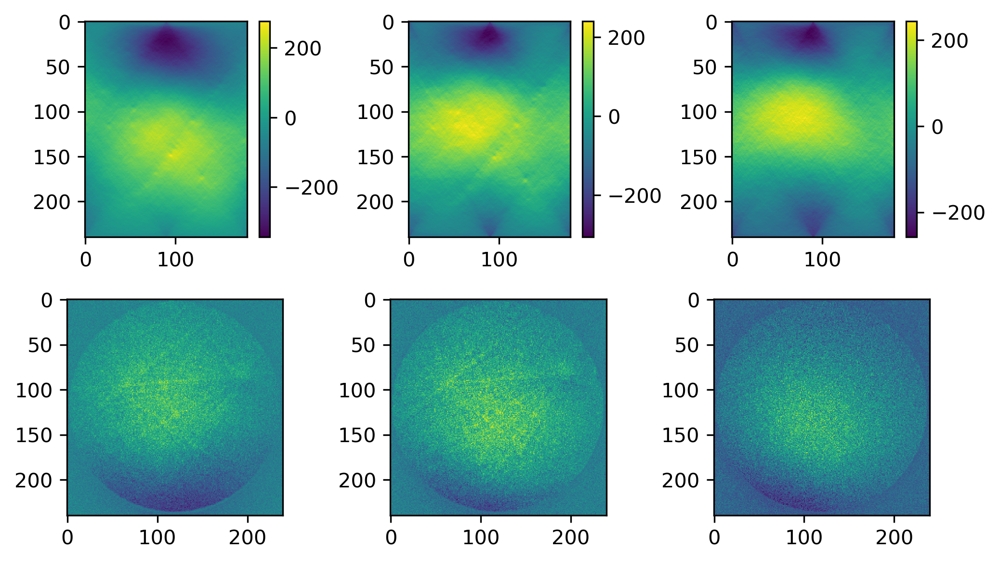

In [4]:
#plotting a few Radon transforms to see what variance is captured between images. The Kikuchi patterns appear as
#dots/dimples in the image
i1 = np.random.randint(0,n_samples)
i2 = np.random.randint(0,n_samples)
i3 = np.random.randint(0,n_samples)

fig, ax = plt.subplots(2, 3, dpi=300, figsize=(7,4))

im1 = ax[0,0].imshow(x_rad[i1].reshape(240,180))
fig.colorbar(im1,ax=ax[0,0])
ax[1,0].imshow(X_raw[i1].reshape(240,240))
im2 = ax[0,1].imshow(x_rad[i2].reshape(240,180))
fig.colorbar(im2,ax=ax[0,1])
ax[1,1].imshow(X_raw[i2].reshape(240,240))
im3 = ax[0,2].imshow(x_rad[i3].reshape(240,180))
fig.colorbar(im3,ax=ax[0,2])
ax[1,2].imshow(X_raw[i3].reshape(240,240))

plt.tight_layout()

In [5]:
#Probably not the best way to covert the radon transforms into a way the machine learning can handle
X = np.asarray(x_rad)

h, w = 240, 180

n_features = h*w

x_var=[]

for i in range(n_samples):
    x_var.append(X[i].flatten())
    
X = np.asarray(x_var)
x_var = []

In [6]:
# Compute a PCA (eigenpatterns) on the dataset (treated as unlabeled
# dataset): unsupervised feature extraction / dimensionality reduction
n_components = 150 #500 or more will make SVM difficult

print("Extracting the top %d eigenpatterns from %d patterns"
      % (n_components, X.shape[0]))
t0 = time()
pca = PCA(n_components=n_components, svd_solver='randomized',
          whiten=True).fit(X)
print("done in %0.3fs" % (time() - t0))

eigenfaces = pca.components_.reshape((n_components, h, w))

print("Projecting the input data on the eigenpatterns orthonormal basis")
t0 = time()
X_pca = pca.transform(X)
print("done in %0.3fs" % (time() - t0))

Extracting the top 150 eigenpatterns from 5955 patterns
done in 21.778s
Projecting the input data on the eigenpatterns orthonormal basis
done in 2.334s


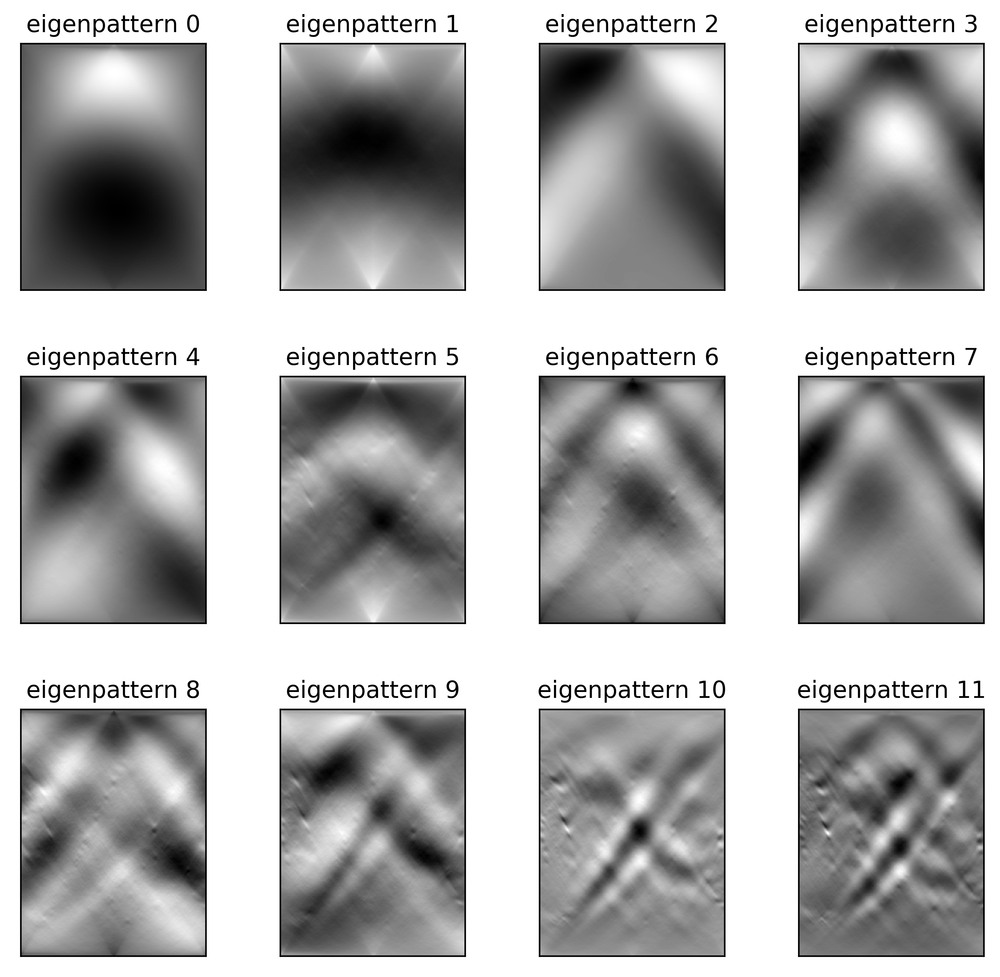

In [7]:
#Plotting the first few PCA components. These are Radon transforms. They could be transformed back to possible get
#a better understanding of what in the Kikuchi patterns the machine is learning on
def plot_gallery(images, titles, h, w, n_row=3, n_col=4):
    """Helper function to plot a gallery of portraits"""
    plt.figure(figsize=(1.8 * n_col, 2.4 * n_row),dpi=500)
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    for i in range(n_row * n_col):
        plt.subplot(n_row, n_col, i + 1)
        plt.imshow(images[i].reshape((h, w)), cmap=plt.cm.gray)
        plt.title(titles[i], size=12)
        plt.xticks(())
        plt.yticks(())


# plot the result of the prediction on a portion of the test set

def title(y_pred, y_test, target_names, i):
    pred_name = target_names[y_pred[i]].rsplit(' ', 1)[-1]
    true_name = target_names[y_test[i]].rsplit(' ', 1)[-1]
    return 'predicted: %s\ntrue:      %s' % (pred_name, true_name)

eigenface_titles = ["eigenpattern %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(eigenfaces, eigenface_titles, h, w)

plt.show()

In [8]:
from skimage.transform import iradon

tr_eigen = []

for i in range(eigenfaces.shape[0]):
    tr_eigen.append(iradon(eigenfaces[i]))

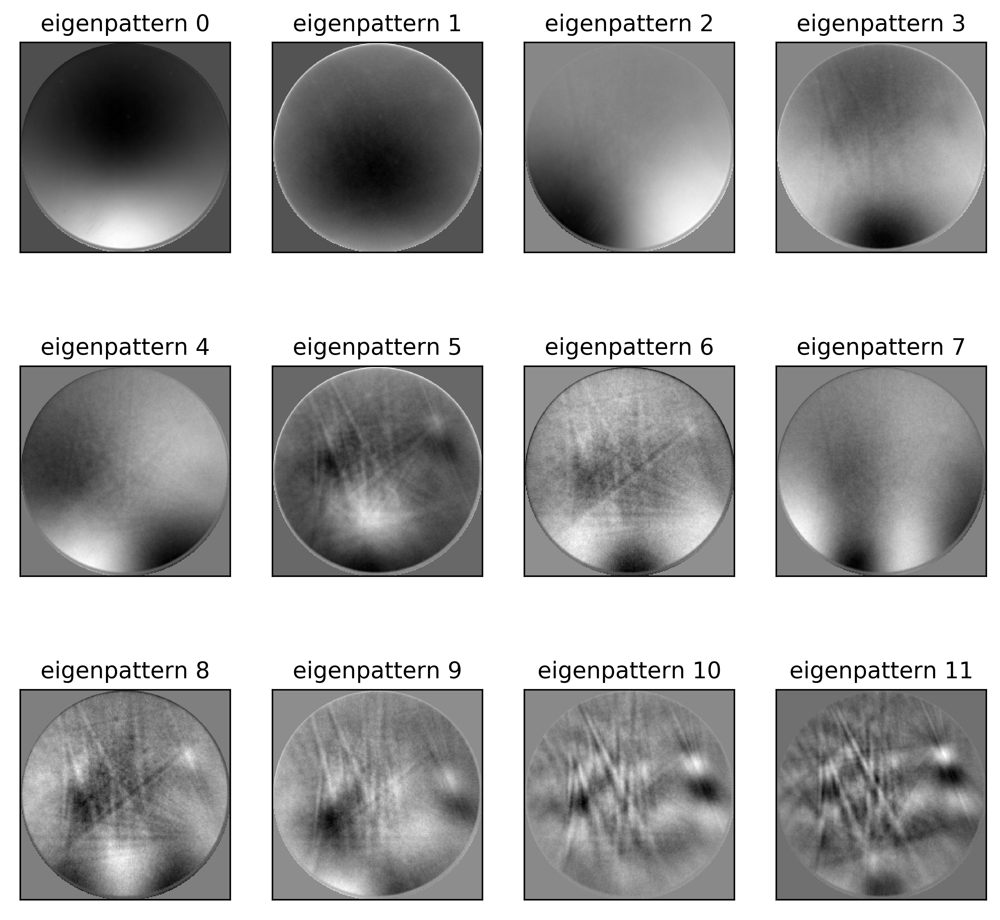

In [9]:
eigenface_titles = ["eigenpattern %d" % i for i in range(eigenfaces.shape[0])]
plot_gallery(tr_eigen, eigenface_titles, 240, 240)

plt.show()

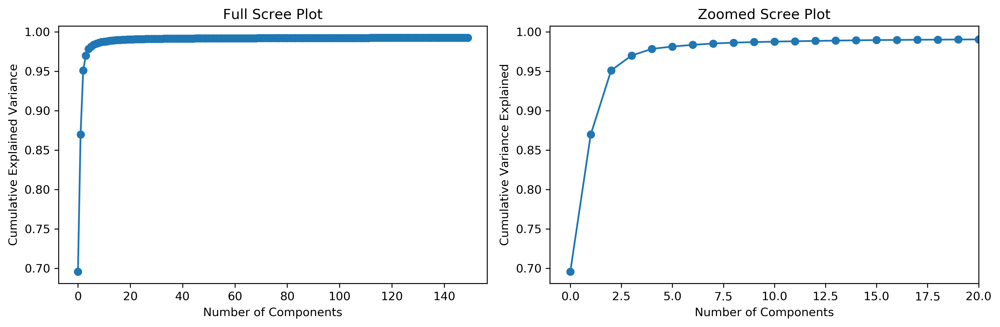

In [10]:
#Scree plots for PCA components. The Radon transform greatly increases the amount of variance the first few PCA
#components are able to cover
fig, ax = plt.subplots(ncols=2, figsize=(12, 4), dpi=300)

ax[0].plot(np.cumsum(pca.explained_variance_ratio_),marker='o')
ax[0].set_xlabel('Number of Components')
ax[0].set_ylabel('Cumulative Explained Variance')
ax[0].set_title('Full Scree Plot')

ax[1].plot(np.cumsum(pca.explained_variance_ratio_),marker='o')
ax[1].set_xlabel('Number of Components')
ax[1].set_ylabel('Cumulative Variance Explained')
ax[1].set_xlim(-1,20)
ax[1].set_title('Zoomed Scree Plot')

plt.tight_layout()

In [11]:
#Plotting the first first PCA components as abundance maps on the scan region. Plotting the mean value from the pandas
#dataframe roughly approximates the SEM image for comparison

pca_comp = 30
pca_lst=[]

for i in range(pca_comp):
    pca_lst.append(X_pca[:,i])
    
#import some more stuff for plotting purposes
from matplotlib import pyplot as plt
from matplotlib import cm
from scipy.interpolate import griddata

#defining variables for plotting
x = data['X'].values
y = data['Y Real'].values


#determine grid boundaries
gridsize = 1000
x_min = 0
x_max = 12000
y_min = 0
y_max = 105000

xx = np.linspace(x_min, x_max, gridsize) # array of x values
yy = np.linspace(y_min, y_max, gridsize) # array of y values
grid = np.array(np.meshgrid(xx, yy.T))
grid = grid.reshape(2, grid.shape[1]*grid.shape[2]).T
    
fig, axs = plt.subplots(1, pca_comp, dpi=1000, constrained_layout=False, figsize=(3,6))

fig.suptitle('PCA Abundance Maps',x=2.75,horizontalalignment='center',y=0.95, fontsize=16)

for i, j in enumerate(pca_lst):

    points = np.array([x, y]).T # because griddata wants it that way
    z_grid2 = griddata(points, j, grid, method='nearest')
    # you get a 1D vector as result. Reshape to picture format!
    z_grid2 = z_grid2.reshape(xx.shape[0], yy.shape[0])

    axs[i].imshow(z_grid2, extent=[x_min, x_max,y_min, y_max],
            origin='upper', cmap=cm.inferno)
    
    axs[i].set_xlabel('')
    axs[i].set_xticks([])
    axs[i].set_ylabel('')
    axs[i].set_yticks([])
    axs[i].set_title(str(i), y=1.01)
    plt.setp(axs[i].xaxis.get_majorticklabels(), rotation=90)

plt.subplots_adjust(left=0.5,right=5)

In [12]:
def regress(var_name):
    #defining the target values
    Y = data[str(var_name)].values

    #Looking for nan and averaging them over nearest pixels, there always seems to be one
    print('Looking for nan values')
    ind = np.argwhere(np.isnan(Y))
    if np.isnan(Y).any():
        print('Averaging nan values')
        for i in [ind]:
            Y[i] = np.mean((Y[i-1],Y[i+1]),dtype='float32')
            print(str(Y[i]) + 'for index ' + str(i))
    else:
        print('No nan values found')
    
    # split into a training and testing set
    X_train, X_test, y_train, y_test = train_test_split(
        X, Y, test_size=0.25)

    #projecting the data onto the principal components
    print("Projecting the input data on the eigenpatterns orthonormal basis")
    t0 = time()
    X_train_pca = pca.transform(X_train)
    X_test_pca = pca.transform(X_test)
    X_pca = pca.transform(X)
    print("done in %0.3fs" % (time() - t0))

    #Train a SVM regression model (5-10 min)
    print("Fitting the classifier to the training set")
    t0 = time()
    param_grid = {'C': [5e3, 1e4, 5e4],
                  'gamma': [0.0005, 0.001, 0.005, 0.01], }
    clf = GridSearchCV(SVR(kernel='rbf',),
                       param_grid, cv=5, iid=False)

    clf = clf.fit(X_train_pca, y_train)
    print("done in %0.3fs" % (time() - t0))
    print("Best estimator found by grid search:")
    print(clf.best_estimator_)

    #Reporting the scores
    print('The training score:')
    print(clf.score(X_train_pca, y_train))
    print('The test score:')
    print(clf.score(X_test_pca, y_test))

    #Using the trained SVM to predict on the full data set for mapping later.
    print("Predicting pattern based on the data set")
    t0 = time()
    SVM_pca_pred = clf.predict(X_pca)
    print("done in %0.3fs" % (time() - t0))

    #Plotting the true values, predicted, and then error by X,Y positions of patterns
    fig, axs = plt.subplots(1, 3, dpi=500, constrained_layout=False, figsize=(0.5,5))

    fig.suptitle('Predicted ' + str(var_name) + ' Analysis', x=2.75, horizontalalignment='center', y=1.01, fontsize=16)

    error = Y-SVM_pca_pred

    for i, j in enumerate([Y,SVM_pca_pred,error]):

        points = np.array([x, y]).T # because griddata wants it that way
        z_grid2 = griddata(points, j, grid, method='nearest')
        # you get a 1D vector as result. Reshape to picture format!
        z_grid2 = z_grid2.reshape(xx.shape[0], yy.shape[0])

        axs[i].imshow(z_grid2, extent=[x_min, x_max,y_min, y_max],
                origin='upper', cmap=cm.inferno)


        #plt.xticks(rotation='90')
        axs[i].set_xlabel('x (nm)')
        axs[i].set_xticks(np.arange(x_min,x_max+1,6000,))
        axs[0].set_ylabel('y (nm)')
        axs[0].set_yticks(np.arange(y_min,y_max+1,15000))
        axs[1].set_yticks([])
        axs[2].set_yticks([])
        plt.setp(axs[i].xaxis.get_majorticklabels(), rotation=90)

    #plt.xticks(rotation='90')
    plt.subplots_adjust(left=0.5,right=5)
    axs[0].set_title('Ground', y=1.01)
    axs[1].set_title('Predicted', y=1.01)
    axs[2].set_title('Error', y=1.01)
    return

Looking for nan values
Averaging nan values
[[7781.911]]for index [[2073]]
Projecting the input data on the eigenpatterns orthonormal basis
done in 4.596s
Fitting the classifier to the training set
done in 268.360s
Best estimator found by grid search:
SVR(C=10000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.005,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
The training score:
0.9887362669676117
The test score:
0.9129479186385391
Predicting pattern based on the data set
done in 4.300s


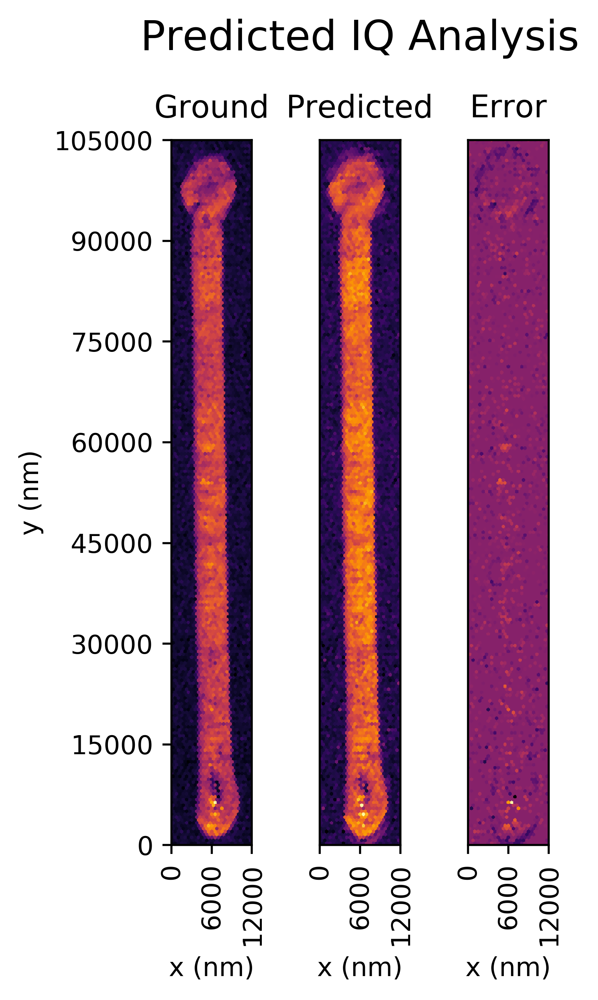

In [13]:
regress(var_name = 'IQ')

Looking for nan values
Averaging nan values
[[0.027]]for index [[2073]]
Projecting the input data on the eigenpatterns orthonormal basis
done in 6.030s
Fitting the classifier to the training set
done in 109.116s
Best estimator found by grid search:
SVR(C=5000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.01,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
The training score:
0.7566007801643598
The test score:
0.25533790461831474
Predicting pattern based on the data set
done in 1.646s


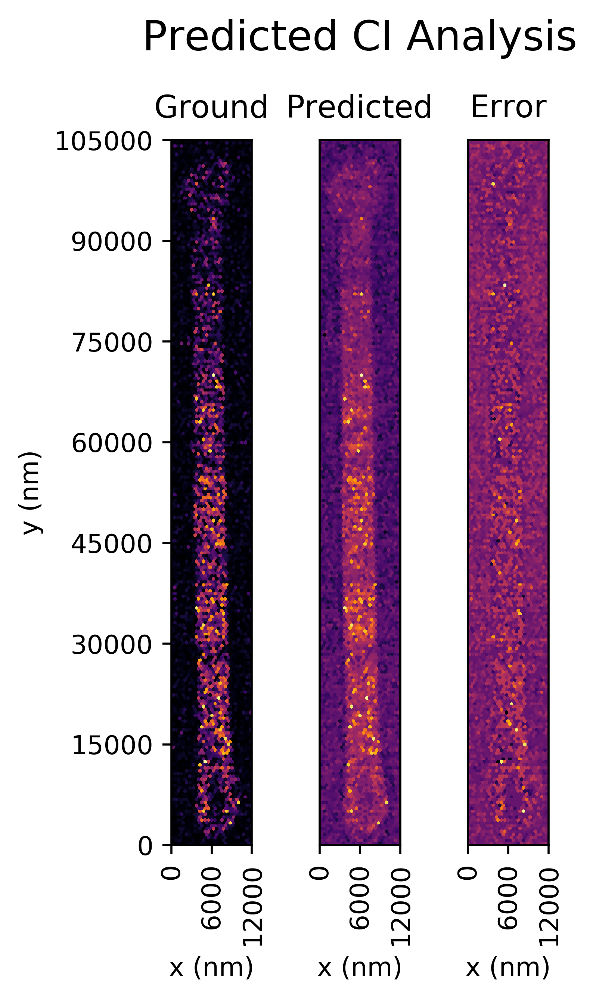

In [31]:
regress(var_name = 'CI')

Looking for nan values
Averaging nan values
[[1.10462]]for index [[2073]]
Projecting the input data on the eigenpatterns orthonormal basis
done in 5.529s
Fitting the classifier to the training set
done in 484.926s
Best estimator found by grid search:
SVR(C=5000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.01,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
The training score:
0.9608961737758565
The test score:
-0.1562304646028232
Predicting pattern based on the data set
done in 3.532s


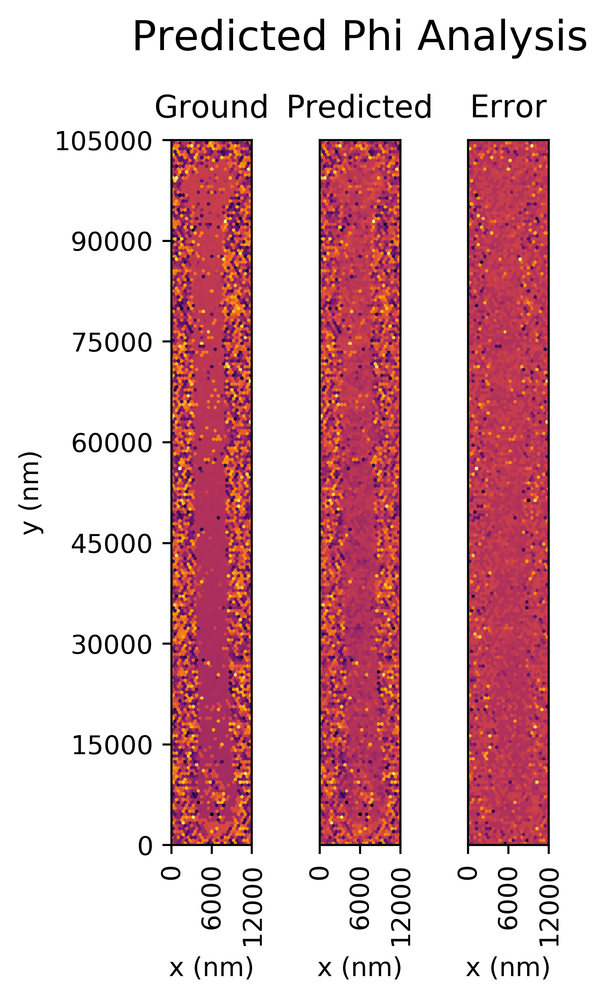

In [32]:
regress(var_name = 'Phi')

Looking for nan values
Averaging nan values
[[1.664155]]for index [[2073]]
Projecting the input data on the eigenpatterns orthonormal basis
done in 4.959s
Fitting the classifier to the training set
done in 690.628s
Best estimator found by grid search:
SVR(C=5000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.01,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
The training score:
0.9971245951052726
The test score:
0.09538437619972351
Predicting pattern based on the data set
done in 4.336s


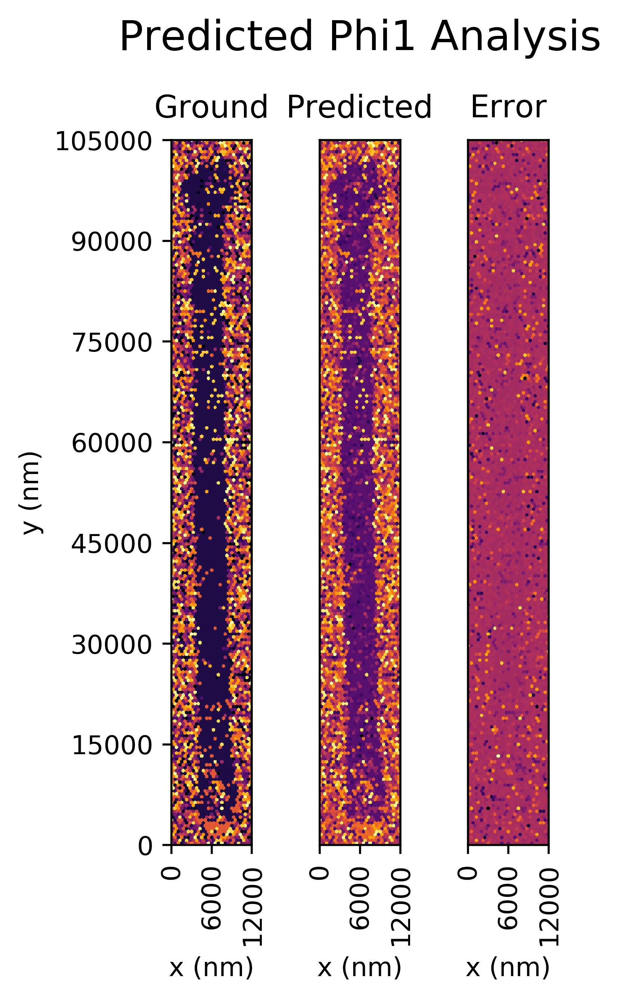

In [33]:
regress(var_name = 'Phi1')

Looking for nan values
Averaging nan values
[[2.8629751]]for index [[2073]]
Projecting the input data on the eigenpatterns orthonormal basis
done in 5.702s
Fitting the classifier to the training set
done in 689.186s
Best estimator found by grid search:
SVR(C=5000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.01,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
The training score:
0.9973516164915357
The test score:
-0.06741345465268611
Predicting pattern based on the data set
done in 5.150s


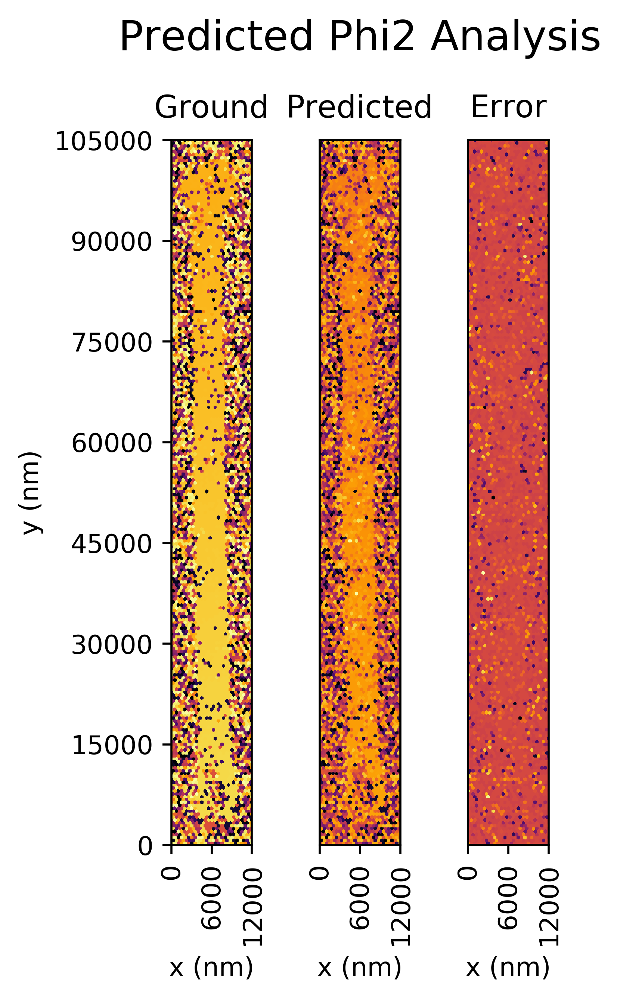

In [34]:
regress(var_name = 'Phi2')

Looking for nan values
Averaging nan values
[[1.964]]for index [[2073]]
Projecting the input data on the eigenpatterns orthonormal basis
done in 7.634s
Fitting the classifier to the training set
done in 328.346s
Best estimator found by grid search:
SVR(C=5000.0, cache_size=200, coef0=0.0, degree=3, epsilon=0.1, gamma=0.01,
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
The training score:
0.9237397558627559
The test score:
0.46005284646650724
Predicting pattern based on the data set
done in 3.524s


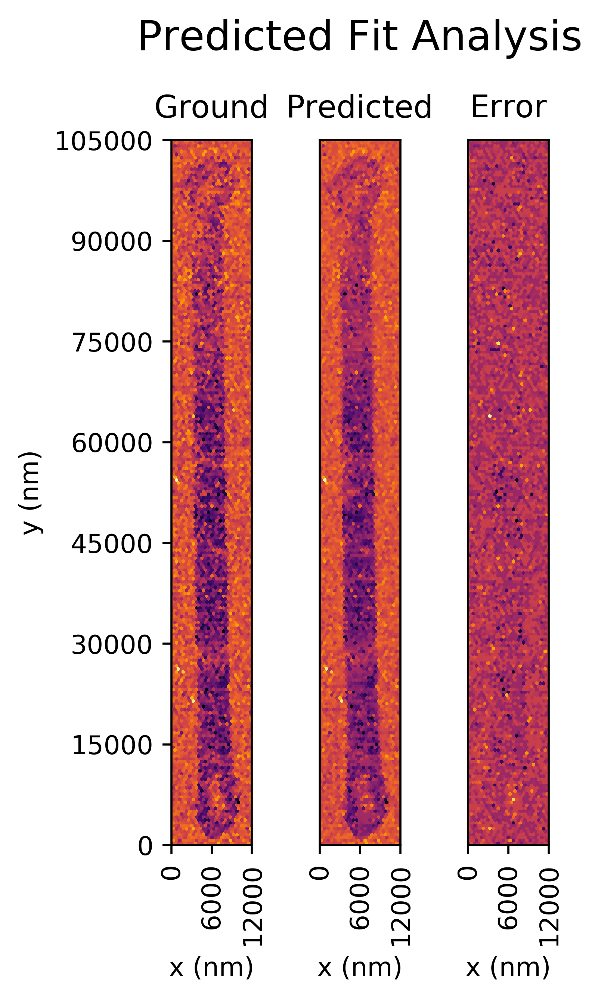

In [35]:
regress(var_name = 'Fit')